## SAS Tokens Configurations:

In [0]:
# Fill With The Required SAS Tokens
booking_sas_token = 
submissions_sas_token = 
airbnb_sas_token = 


## Booking Data Handling:


In [0]:
# Setting up access to the data
# Azure storage details
storage_account = "lab94290"
container = "booking"


# Configure Spark to use the SAS token for authentication
# Using booking SAS token for access to the data
spark.conf.set(f"fs.azure.account.auth.type.{storage_account}.dfs.core.windows.net", "SAS")
spark.conf.set(f"fs.azure.sas.token.provider.type.{storage_account}.dfs.core.windows.net", "org.apache.hadoop.fs.azurebfs.sas.FixedSASTokenProvider")
spark.conf.set(f"fs.azure.sas.fixed.token.{storage_account}.dfs.core.windows.net", booking_sas_token)

# Loading the Booking.com data
# Path to the main parquet file (this is the big one)
full_data_path = f"abfss://{container}@{storage_account}.dfs.core.windows.net/booking_1_9.parquet"

# Read the parquet file into Spark
df = spark.read.parquet(full_data_path)


# London area boundaries

# Rough bounding box for Greater London
# We use this to filter out hotels that are outside London
LONDON_LAT_MIN = 51.28
LONDON_LAT_MAX = 51.69
LONDON_LON_MIN = -0.51
LONDON_LON_MAX = 0.33


# Extract coordinates and keep only London listings

from pyspark.sql.functions import col

# The coordinates column is a struct, so we extract lat and lon from it
df_with_coords = df.withColumn("lat", col("coordinates.lan")) \
                   .withColumn("lon", col("coordinates.lon"))

# Filter rows that are inside the London bounding box
df_london = df_with_coords.filter(
    (col("lat") >= LONDON_LAT_MIN) & 
    (col("lat") <= LONDON_LAT_MAX) &
    (col("lon") >= LONDON_LON_MIN) & 
    (col("lon") <= LONDON_LON_MAX)
)


# Keep only the columns we actually need
# Selecting relevant columns and caching since we reuse this later
df_final = df_london.select(
    "hotel_id",
    "title",
    "city",
    "country",
    "lat",
    "lon"
).cache()


# Quick checks
# Check how many rows we have before and after filtering
print(f"Total Rows in full dataset: {df.count():,}")
print(f"Total Rows in London: {df_final.count():,}")

# Show a few rows to make sure everything looks fine
print("\nLondon Booking.com Amenities:")
display(df_final.limit(10))


Total Rows in full dataset: 3,239,391
Total Rows in London: 21,649

London Booking.com Amenities:


hotel_id,title,city,country,lat,lon
11971239,Immaculate Refurbished House,London,UK,51.523127624,-0.016621092841999998
2941169,Sublime flat with Thames view,London,UK,51.510746,-0.09556
13318843,Trendy 2 Bed in Maida Vale with Private Garden,London,UK,51.54332160467889,-0.1951392037353572
6848339,"Residential Quarters, General Gordon Square",London,UK,51.488413420203,0.066722686398
9836868,Stylish and Spacious- One Bed in Nine Elms,London,UK,51.480276391275,-0.128675322684
2855058,"London Studio Apartments, Private Bathrooms and Parking",Ilford,UK,51.5639894,0.0805648000000474
9128404,Mannbuilding,London,UK,51.5230309,0.0310089
9730432,"Unique Modern, Private Apartment,15 Mins To Central London",Hendon,UK,51.58262826585746,-0.22789090154152758
12812494,Cozy Double Room Next to Putney Bridge and High Street,London,UK,51.4655672540877,-0.21493096007391402
9161382,Lovely One Bed Apartment-Near All Transport-Village-FreeParking,London,UK,51.5816055,-0.0151151


## External OSM Data Handling:


In [0]:
# Urban Displacement Index – processing OSM infrastructure data
# This part loads the tourist/local geojson files from Azure and cleans them

import json
import pandas as pd
import numpy as np
from pyspark.sql import functions as F
from pyspark.sql.types import *



# Configure Spark to use this token
# Using submissions SAS token for access to the data
storage_account = "lab94290"
container = "submissions"
spark.conf.set(f"fs.azure.account.auth.type.{storage_account}.dfs.core.windows.net", "SAS")
spark.conf.set(f"fs.azure.sas.token.provider.type.{storage_account}.dfs.core.windows.net", 
               "org.apache.hadoop.fs.azurebfs.sas.FixedSASTokenProvider")
spark.conf.set(f"fs.azure.sas.fixed.token.{storage_account}.dfs.core.windows.net", submissions_sas_token)

# Define the base path
base_path = f"abfss://{container}@{storage_account}.dfs.core.windows.net/Yam_Naama_Elad/"


# Read as text using DataFrame API
tourist_text_df = spark.read.text(f"{base_path}tourist_infrastructure.geojson")
local_text_df = spark.read.text(f"{base_path}local_infrastructure.geojson")

# Collect all lines and parse as JSON
tourist_json_lines = [row.value for row in tourist_text_df.collect()]
local_json_lines = [row.value for row in local_text_df.collect()]

tourist_geojson = json.loads("".join(tourist_json_lines))
local_geojson = json.loads("".join(local_json_lines))

# Overpass sometimes returns a custom "elements" format,
# and sometimes a regular GeoJSON, so this function handles both.
def process_osm_geojson(geojson_data, infrastructure_type):
    """Process Overpass GeoJSON to DataFrame"""
    elements = []
    
    if 'elements' in geojson_data:
        # Overpass raw output
        for elem in geojson_data['elements']:
            if elem['type'] == 'node':
                lat, lon = elem.get('lat'), elem.get('lon')
            elif 'center' in elem:
                lat = elem['center'].get('lat')
                lon = elem['center'].get('lon')
            else:
                continue
                
            tags = elem.get('tags', {})
            elements.append({
                'osm_id': elem.get('id'),
                'osm_type': elem.get('type'),
                'lat': lat,
                'lon': lon,
                'infrastructure_type': infrastructure_type,
                'name': tags.get('name', 'Unknown'),
                'amenity': tags.get('amenity', ''),
                'shop': tags.get('shop', ''),
                'tourism': tags.get('tourism', ''),
                'historic': tags.get('historic', '')
            })
    else:
        # Standard GeoJSON format
        for feature in geojson_data.get('features', []):
            coords = feature['geometry']['coordinates']
            lon, lat = coords[0], coords[1]
            
            props = feature.get('properties', {})
            elements.append({
                'osm_id': feature.get('id'),
                'osm_type': 'node',
                'lat': lat,
                'lon': lon,
                'infrastructure_type': infrastructure_type,
                'name': props.get('name', 'Unknown'),
                'amenity': props.get('amenity', ''),
                'shop': props.get('shop', ''),
                'tourism': props.get('tourism', ''),
                'historic': props.get('historic', '')
            })
    
    return pd.DataFrame(elements)

# Build the tourist and local infrastructure datasets
tourist_df = process_osm_geojson(tourist_geojson, 'tourist')
local_df = process_osm_geojson(local_geojson, 'local')

# Create a single category field from the OSM tags
# We just take the first tag that exists
def determine_category(row):
    """Determine category from tags"""
    for col in ['amenity', 'shop', 'tourism', 'historic']:
        if row[col] and row[col] != '':
            return f"{col}:{row[col]}"
    return 'unknown'

tourist_df['category'] = tourist_df.apply(determine_category, axis=1)
local_df['category'] = local_df.apply(determine_category, axis=1)

# Remove some categories that mostly add noise
unwanted_tourist = ['amenity:bench', 'tourism:artwork', 'amenity:waste_basket']
tourist_df = tourist_df[~tourist_df['category'].isin(unwanted_tourist)]

# Clean the pandas DataFrames so Spark won't break on types / NaNs
def clean_df_for_spark(df):
    """Clean DataFrame to avoid Arrow optimization issues"""
    df_clean = df.copy()
    
    # Convert lists or dicts to strings if they exist
    for col in df_clean.columns:
        if df_clean[col].apply(lambda x: isinstance(x, (list, dict))).any():
            df_clean[col] = df_clean[col].apply(
                lambda x: str(x) if isinstance(x, (list, dict)) else x
            )
    
    # Replace NaNs in string columns
    string_cols = [
        'name', 'amenity', 'shop', 'tourism',
        'historic', 'category', 'infrastructure_type', 'osm_type'
    ]
    for col in string_cols:
        if col in df_clean.columns:
            df_clean[col] = df_clean[col].fillna('')
    
    # Make sure coordinates are numeric
    df_clean['lat'] = pd.to_numeric(df_clean['lat'], errors='coerce')
    df_clean['lon'] = pd.to_numeric(df_clean['lon'], errors='coerce')
    df_clean['osm_id'] = df_clean['osm_id'].astype(str)
    
    # Drop rows with bad coordinates
    df_clean = df_clean.dropna(subset=['lat', 'lon'])
    
    return df_clean

tourist_df_clean = clean_df_for_spark(tourist_df)
local_df_clean = clean_df_for_spark(local_df)

# Keep only points inside the London bounding box
LONDON_BOUNDS = {
    'min_lat': 51.28,
    'max_lat': 51.69,
    'min_lon': -0.51,
    'max_lon': 0.34
}

def filter_to_london(df, bounds):
    """Filter DataFrame to London bounding box"""
    return df[
        (df['lat'] >= bounds['min_lat']) &
        (df['lat'] <= bounds['max_lat']) &
        (df['lon'] >= bounds['min_lon']) &
        (df['lon'] <= bounds['max_lon'])
    ]

tourist_df_clean = filter_to_london(tourist_df_clean, LONDON_BOUNDS)
local_df_clean = filter_to_london(local_df_clean, LONDON_BOUNDS)

# Convert to Spark DataFrames
spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "false")

spark_tourist = spark.createDataFrame(tourist_df_clean)
spark_local = spark.createDataFrame(local_df_clean)

# Combine tourist and local infrastructure into one dataset
combined_df = spark_tourist.union(spark_local)

# Quick sanity checks
print("Data Processing Complete")
print(f"Tourist Infrastructure: {spark_tourist.count():,} points")
print(f"Local Infrastructure: {spark_local.count():,} points")
print(f"Combined: {combined_df.count():,} points")

print("\nTourist Infrastructure Sample (5 rows):")
display(spark_tourist.limit(5))

print("\nLocal Infrastructure Sample (5 rows):")
display(spark_local.limit(5))

print("\nCombined Infrastructure Sample (5 rows):")
display(combined_df.limit(5))

print("\nTop 10 Tourist Categories:")
display(
    spark_tourist.groupBy('category')
    .count()
    .orderBy('count', ascending=False)
    .limit(10)
)

print("\nTop 10 Local Categories:")
display(
    spark_local.groupBy('category')
    .count()
    .orderBy('count', ascending=False)
    .limit(10)
)

Data Processing Complete
Tourist Infrastructure: 4,615 points
Local Infrastructure: 16,335 points
Combined: 20,950 points

Tourist Infrastructure Sample (5 rows):


osm_id,osm_type,lat,lon,infrastructure_type,name,amenity,shop,tourism,historic,category
way/4082589,node,51.5104369,-0.1301305,tourist,Leicester Square,,,attraction,,tourism:attraction
way/4255486,node,51.5602457,-0.1660937,tourist,Mixed Bathing Pond No 3,,,attraction,,tourism:attraction
way/4256958,node,51.5046612,-0.1282961,tourist,Horse Guards Parade,,,attraction,,tourism:attraction
way/4361223,node,51.5107273,-0.1276572,tourist,Cecil Court,,,attraction,,tourism:attraction
way/4372002,node,51.5088888,-0.1287522,tourist,National Gallery,,,gallery,,tourism:gallery



Local Infrastructure Sample (5 rows):


osm_id,osm_type,lat,lon,infrastructure_type,name,amenity,shop,tourism,historic,category
way/4055100,node,51.5571324,-0.3427115,local,PassMasters Motorcycle Training,driving_school,,,,amenity:driving_school
way/4068461,node,51.5535089,-0.3484553,local,Wood End Primary School,school,,,,amenity:school
way/4076656,node,51.4301275,-0.0332503,local,Sainsbury's,,supermarket,,,shop:supermarket
way/4097475,node,51.5860472,-0.1053599,local,North Harringay Primary School,school,,,,amenity:school
way/4132124,node,51.5402753,-0.2189061,local,Queens Park Community School,school,,,,amenity:school



Combined Infrastructure Sample (5 rows):


osm_id,osm_type,lat,lon,infrastructure_type,name,amenity,shop,tourism,historic,category
way/4082589,node,51.5104369,-0.1301305,tourist,Leicester Square,,,attraction,,tourism:attraction
way/4255486,node,51.5602457,-0.1660937,tourist,Mixed Bathing Pond No 3,,,attraction,,tourism:attraction
way/4256958,node,51.5046612,-0.1282961,tourist,Horse Guards Parade,,,attraction,,tourism:attraction
way/4361223,node,51.5107273,-0.1276572,tourist,Cecil Court,,,attraction,,tourism:attraction
way/4372002,node,51.5088888,-0.1287522,tourist,National Gallery,,,gallery,,tourism:gallery



Top 10 Tourist Categories:


category,count
historic:memorial,2431
shop:gift,606
tourism:attraction,383
tourism:gallery,312
tourism:museum,233
tourism:viewpoint,198
historic:monument,187
amenity:bureau_de_change,170
amenity:place_of_worship,14
amenity:clock,10



Top 10 Local Categories:


category,count
shop:hairdresser,4623
amenity:school,3673
amenity:pharmacy,1410
shop:supermarket,1391
amenity:dentist,1248
amenity:doctors,976
amenity:post_office,763
amenity:kindergarten,686
amenity:clinic,531
shop:butcher,529


## Combining Booking With External Data:


In [0]:
from pyspark.sql.functions import col, lit

# Map the Booking.com hotels to the same structure as the OSM infrastructure data
# This way we can union everything into one dataset
booking_mapped = df_final.select(
    col('hotel_id').alias('osm_id'),          # reuse hotel_id as osm_id for consistency
    lit('node').alias('osm_type'),             # treat hotels as point features
    col('lat'),
    col('lon'),
    lit('tourist').alias('infrastructure_type'),
    col('title').alias('name'),                # hotel name
    lit('booking').alias('amenity'),
    lit(None).alias('shop'),
    lit('booking').alias('tourism'),
    lit(None).alias('historic'),
    lit('tourism:booking_hotel').alias('category')
)

# Add the Booking.com hotels into the combined infrastructure dataset
combined_hotels_df = combined_df.union(booking_mapped)


## Cleaning The Data:


In [0]:
from pyspark.sql.functions import col, split

# Keep only the columns we actually need for the next steps
london_clean_df = combined_hotels_df.select(
    'osm_id',
    'osm_type',
    'lat',
    'lon',
    'infrastructure_type',
    'name',
    'category'
)

# The category column looks like "type:value"
# Here we keep only the value part (after the ':')
london_clean_df = london_clean_df.withColumn(
    'category',
    split(col('category'), ':').getItem(1)
)


In [0]:
# Count how many times each category appears
category_counts = london_clean_df.groupby('category').count().toPandas()
category_dict = dict(zip(category_counts['category'], category_counts['count']))

# Sort categories from most common to least common
category_dict_sorted = dict(
    sorted(category_dict.items(), key=lambda x: x[1], reverse=True)
)

# Print the result so we can see the distribution
print(category_dict_sorted)


{'booking_hotel': 21649, 'hairdresser': 4624, 'school': 3673, 'memorial': 2431, 'pharmacy': 1410, 'supermarket': 1391, 'dentist': 1248, 'doctors': 976, 'post_office': 763, 'kindergarten': 686, 'gift': 606, 'clinic': 531, 'butcher': 529, 'attraction': 383, 'gallery': 312, 'greengrocer': 295, 'museum': 233, 'viewpoint': 198, 'monument': 187, 'bureau_de_change': 170, 'prep_school': 53, 'language_school': 33, 'music_school': 33, 'driving_school': 30, 'hairdresser_supply': 18, 'place_of_worship': 14, 'dancing_school': 12, 'clock': 10, 'cafe': 7, 'arts_centre': 7, 'luggage_locker': 6, 'fountain': 5, 'library': 5, 'trade_school': 4, 'fast_food': 3, 'marketplace': 3, 'theatre': 3, 'gallery;bookshop': 2, 'art_school': 2, 'souvenir': 2, 'pub': 2, 'drinking_water': 2, 'art': 2, 'hairdresser;beauty': 2, 'restaurant': 2, 'attraction;museum': 2, 'department_store': 2, 'mounting_stone': 1, 'events_venue': 1, 'parking': 1, 'training': 1, 'community_centre;preschool': 1, 'cooking_school': 1, 'beauty_cl

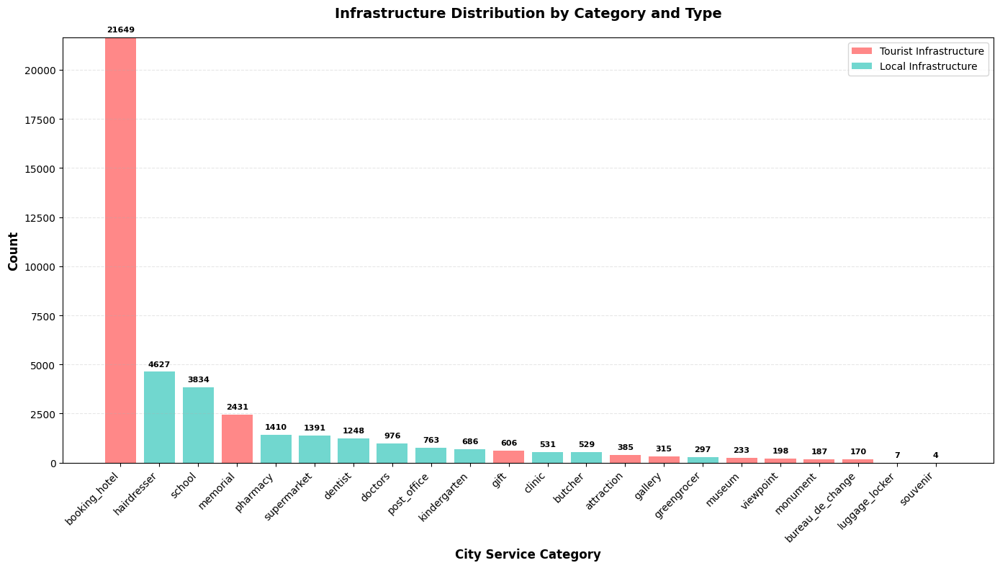

In [0]:
from pyspark.sql.functions import when, col
import matplotlib.pyplot as plt
import pandas as pd

# Some categories show up in slightly different names, so we merge them into one label
london_df_final = london_clean_df.withColumn(
    'category',
    when(col('category').isin(['souvenir', 'souvenirs', 'sports;gift;souvenir']), 'souvenir')
    .when(col('category').isin(['school', 'prep_school', 'language_school', 'music_school', 
                                  'driving_school', 'dancing_school']), 'school')
    .when(col('category').isin(['luggage_locker', 'luggage_locker;convenience;gift']), 'luggage_locker')
    .when(col('category').isin(['gallery', 'art_gallery', 'gallery;bookshop']), 'gallery')
    .when(col('category').isin(['attraction', 'attraction;museum']), 'attraction')
    .when(col('category').isin(['hairdresser', 'hairdresser;beauty', 
                                  'hairdressers']), 'hairdresser')
    .when(col('category').isin(['greengrocer', 'fruiterer;greengrocer', 'greengrocer;florist']), 'greengrocer')
    .otherwise(col('category'))
)

# Filter to only the categories we actually want to compare later (keeps the plot readable)
desired_categories = ['booking_hotel', 'museum', 'attraction', 'gallery', 'viewpoint', 'monument', 
                      'memorial', 'gift', 'souvenir', 'bureau_de_change', 'luggage_locker', 
                      'school', 'kindergarten', 'pharmacy', 'dentist', 'doctors', 'clinic', 
                      'hairdresser', 'post_office', 'supermarket', 'butcher', 'greengrocer']

london_df_final = london_df_final.filter(col('category').isin(desired_categories))

# Count how many items we have per category, split by tourist vs local
category_counts_by_type = london_df_final.groupBy('category', 'infrastructure_type').count().toPandas()

# Pivot so we get a table like: category | tourist_count | local_count
pivot_df = category_counts_by_type.pivot(index='category', columns='infrastructure_type', values='count').fillna(0)

# Sort by total amount so the biggest categories show first
pivot_df['total'] = pivot_df.sum(axis=1)
pivot_df = pivot_df.sort_values('total', ascending=False)
pivot_df = pivot_df.drop('total', axis=1)

# Plot it as a stacked bar chart (tourist + local on top of each other)
fig, ax = plt.subplots(figsize=(14, 8))

categories = pivot_df.index.tolist()
x_pos = range(len(categories))

# Some runs might have only tourist or only local, so we handle missing columns
tourist_counts = pivot_df['tourist'].values if 'tourist' in pivot_df.columns else [0] * len(categories)
local_counts = pivot_df['local'].values if 'local' in pivot_df.columns else [0] * len(categories)

bar_width = 0.8
p1 = ax.bar(x_pos, tourist_counts, bar_width, label='Tourist Infrastructure', color='#FF6B6B', alpha=0.8)
p2 = ax.bar(x_pos, local_counts, bar_width, bottom=tourist_counts, label='Local Infrastructure', color='#4ECDC4', alpha=0.8)

# Basic plot formatting
ax.set_xlabel('City Service Category', fontsize=12, fontweight='bold')
ax.set_ylabel('Count', fontsize=12, fontweight='bold')
ax.set_title('Infrastructure Distribution by Category and Type', fontsize=14, fontweight='bold', pad=20)
ax.set_xticks(x_pos)
ax.set_xticklabels(categories, rotation=45, ha='right')
ax.legend(loc='upper right', fontsize=10)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Add totals above each bar so it's easier to compare quickly
for i, (tourist, local) in enumerate(zip(tourist_counts, local_counts)):
    total = tourist + local
    if total > 0:
        ax.text(i, total + max(tourist_counts + local_counts) * 0.01, f'{int(total)}',
                ha='center', va='bottom', fontsize=8, fontweight='bold')

plt.tight_layout()
plt.show()


## Geographical Handling and Scoring:


In [0]:
%pip install h3 -q

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
import pandas as pd
import h3
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Settings for the H3 grid + smoothing
H3_RESOLUTION = 8 
DECAY_WEIGHTS = [1.0, 0.33]  # how much to count the center hex vs nearby hexes

# Split categories into tourist vs local (used later for scoring)
CATEGORIES = {
    'tourist': ['booking_hotel', 'museum', 'attraction', 'gallery', 'viewpoint', 
                'monument', 'memorial', 'gift', 'souvenir', 'bureau_de_change', 'luggage_locker'],
    'local': ['school', 'kindergarten', 'pharmacy', 'dentist', 'doctors', 
              'clinic', 'hairdresser', 'post_office', 'supermarket', 'butcher', 'greengrocer']
}

# Total counts in London (used for IDF-style weights so rare stuff gets more weight)
LONDON_TOTALS = {
    'booking_hotel': 21649, 'hairdresser': 4629, 'school': 3838, 'memorial': 2431, 
    'pharmacy': 1410, 'supermarket': 1391, 'dentist': 1250, 'doctors': 976, 
    'post_office': 763, 'kindergarten': 686, 'gift': 608, 'clinic': 531, 
    'butcher': 529, 'attraction': 394, 'gallery': 315, 'greengrocer': 297, 
    'museum': 234, 'viewpoint': 199, 'monument': 187, 'bureau_de_change': 170, 
    'luggage_locker': 7, 'souvenir': 4
}

# IDF weights: categories that are very common in London get lower weight
def calculate_idf_weights(category_list, totals_dict):
    total_facilities = sum(totals_dict.get(cat, 1) for cat in category_list)
    weights = {}
    for cat in category_list:
        count = totals_dict.get(cat, 1)
        weights[cat] = np.log(total_facilities / count)
    total_weight = sum(weights.values())
    return {k: v / total_weight for k, v in weights.items()}

# PCA weights: tries to learn which categories matter more from the data itself
# We use only 1 component and take absolute loadings as weights
def calculate_pca_weights(df, category_list, sample_size=10000):
    # although we have ~2800 hexagons, we set the sample size to 10K in order to be able to use it with different resolutions
    available_cats = [c for c in category_list if c in df.columns]
    if not available_cats: return {}
        
    sample_df = df[available_cats].fillna(0)
    if len(df) > sample_size:
        sample_df = sample_df.sample(n=sample_size, random_state=42)
        
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(sample_df)
    
    pca = PCA(n_components=1)
    pca.fit(data_scaled)
    
    loadings = np.abs(pca.components_[0])
    weights = dict(zip(available_cats, loadings))
    total_weight = sum(weights.values())
    return {k: v / total_weight for k, v in weights.items()}

# Main function that builds the H3 grid and computes the displacement score
def calculate_weighted_displacement(df):
    
    # If this is a Spark DF, convert to pandas (we do a lot of pandas ops here)
    if hasattr(df, 'rdd'): 
        df = df.toPandas()

    # Put each point into an H3 hexagon
    df['h3_index'] = [h3.latlng_to_cell(lat, lon, H3_RESOLUTION) 
                      for lat, lon in zip(df['lat'], df['lon'])]

    # Count how many items of each category appear in each hex
    grid_df = df.groupby(['h3_index', 'category']).size().unstack(fill_value=0)
    
    # Make sure all expected categories exist as columns (even if count is 0)
    all_cats = CATEGORIES['tourist'] + CATEGORIES['local']
    for cat in all_cats:
        if cat not in grid_df.columns: 
            grid_df[cat] = 0

    # Build weights using two methods: IDF (based on totals) and PCA (based on variance)
    idf_tourist = calculate_idf_weights(CATEGORIES['tourist'], LONDON_TOTALS)
    idf_local = calculate_idf_weights(CATEGORIES['local'], LONDON_TOTALS)
    pca_tourist = calculate_pca_weights(grid_df, CATEGORIES['tourist'])
    pca_local = calculate_pca_weights(grid_df, CATEGORIES['local'])
    
    # Combine the two weight ideas by just averaging them
    def get_combined_weight(cat, idf_dict, pca_dict):
        return (idf_dict.get(cat, 0) + pca_dict.get(cat, 0)) / 2

    tourist_cols = [c for c in CATEGORIES['tourist'] if c in grid_df.columns]
    local_cols = [c for c in CATEGORIES['local'] if c in grid_df.columns]
    
    t_weights = [get_combined_weight(c, idf_tourist, pca_tourist) for c in tourist_cols]
    l_weights = [get_combined_weight(c, idf_local, pca_local) for c in local_cols]
    
    # Compute one score for tourist infra and one for local infra (weighted sums)
    grid_df['tourist_score'] = grid_df[tourist_cols].dot(t_weights)
    grid_df['local_score'] = grid_df[local_cols].dot(l_weights)
    
    # Raw displacement formula (mix of log-ratio + difference)
    # Small constant is there to avoid divide by zero
    t = grid_df['tourist_score']
    l = grid_df['local_score']
    grid_df['raw_displacement'] = (0.5 * np.log((t + 0.1) / (l + 0.1))) + (0.5 * (t - l) / (t + l + 0.1))
    
    # Normalize using percentiles so extreme outliers don’t dominate everything
    p05 = grid_df['raw_displacement'].quantile(0.05)
    p95 = grid_df['raw_displacement'].quantile(0.95)
    
    def normalize_score(x):
        if x >= p95: return 1.0
        if x <= p05: return 0.0
        return (x - p05) / (p95 - p05)
    
    grid_df['normalized_score'] = grid_df['raw_displacement'].apply(normalize_score)

    # Pre-compute neighbors for each hex (so we don’t call h3 functions a million times)
    all_hexes = set(grid_df.index)
    neighbor_cache = {}
    
    for hex_id in all_hexes:
        neighbor_cache[hex_id] = []
        for k, weight in enumerate(DECAY_WEIGHTS):
            try:
                ring = h3.grid_ring(hex_id, k)
                for neighbor in ring:
                    if neighbor in all_hexes:
                        neighbor_cache[hex_id].append((neighbor, weight))
            except:
                # some hexes can fail on ring calls depending on location
                pass
    

    # Smooth the score using nearby hexes (kind of like a blur so it’s less noisy)
    score_dict = grid_df['normalized_score'].to_dict()

    def get_smoothed_score(hex_id):
        weighted_sum = 0
        total_weight = 0
        
        for neighbor_hex, weight in neighbor_cache.get(hex_id, []):
            neighbor_score = score_dict.get(neighbor_hex, 0.0)
            weighted_sum += neighbor_score * weight
            total_weight += weight
        
        return weighted_sum / total_weight if total_weight > 0 else score_dict.get(hex_id, 0.0)
    
    grid_df['final_smoothed_score'] = [get_smoothed_score(hex_id) for hex_id in grid_df.index]
    
    # Just printing some basic stats so we know the output makes sense
    print("\nSummary Statistics:")
    print(f"  Total hexagons: {len(grid_df)}")
    print(f"\nDisplacement Distribution:")
    print(f"  High displacement (>0.7): {(grid_df['final_smoothed_score'] > 0.7).sum()}")
    print(f"  Medium displacement (0.3-0.7): {((grid_df['final_smoothed_score'] >= 0.3) & (grid_df['final_smoothed_score'] <= 0.7)).sum()}")
    print(f"  Low displacement (<0.3): {(grid_df['final_smoothed_score'] < 0.3).sum()}")
    
    # Reset index so h3_index becomes a normal column again
    result_df = grid_df.reset_index()
    
    # Sometimes pandas names it "index", so we fix that
    if 'index' in result_df.columns:
        result_df = result_df.rename(columns={'index': 'h3_index'})
    
    return result_df

# Run the scoring on the London dataset
london_grid_scores = calculate_weighted_displacement(london_df_final)

# Show a few rows just to see the output format
print("\nSample of Results:")
display(london_grid_scores.head(5))


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run aged-newt-875 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/200762682747319/runs/59911210c2034e47ae009831b107d845
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/200762682747319


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run victorious-mule-8 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/200762682747319/runs/5757e3292e9e4d6d82a3ad13d654e83b
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/200762682747319

Summary Statistics:
  Total hexagons: 2739

Displacement Distribution:
  High displacement (>0.7): 460
  Medium displacement (0.3-0.7): 1810
  Low displacement (<0.3): 469

Sample of Results:


h3_index,attraction,booking_hotel,bureau_de_change,butcher,clinic,dentist,doctors,gallery,gift,greengrocer,hairdresser,kindergarten,luggage_locker,memorial,monument,museum,pharmacy,post_office,school,souvenir,supermarket,viewpoint,tourist_score,local_score,raw_displacement,normalized_score,final_smoothed_score
88194a8b41fffff,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.09749608037916262,-0.587104694575869,0.24886983123498252,0.22151620354490748
88194a8b45fffff,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0.0,0.1250022135686064,-0.6832499911221837,0.20454707459060797,0.28335855530831816
88194a8b4dfffff,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.0,0.16150324857829057,-0.7894360465191181,0.15559555162019173,0.18386935574857627
88194a8b69fffff,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.0,0.09924154861437492,-0.593722184175886,0.24581918402004632,0.303088934940052
88194a8b6bfffff,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.06332608018192477,0.0,0.43915321062849,0.7219723231995983,0.5244537280368158


## Airbnb Data Handling:


In [0]:
# Loading the Airbnb dataset from Azure (with a try/except so the notebook won't crash)

from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType

# Azure storage info for the Airbnb container
storage_account = "lab94290"  
container = "airbnb"


airbnb_sas_token = airbnb_sas_token.lstrip('?')

# Configure Spark to use the SAS token
# Using airbnb SAS token for access to the data
spark.conf.set(f"fs.azure.account.auth.type.{storage_account}.dfs.core.windows.net", "SAS")
spark.conf.set(f"fs.azure.sas.token.provider.type.{storage_account}.dfs.core.windows.net", 
               "org.apache.hadoop.fs.azurebfs.sas.FixedSASTokenProvider")
spark.conf.set(f"fs.azure.sas.fixed.token.{storage_account}.dfs.core.windows.net", airbnb_sas_token)

# Path to the Airbnb parquet dataset
path = f"abfss://{container}@{storage_account}.dfs.core.windows.net/airbnb_1_12_parquet"

# Load the data (and ignore broken/corrupt parquet files if there are any)

airbnb_df = spark.read \
        .option("ignoreCorruptFiles", "true") \
        .option("mode", "PERMISSIVE") \
        .parquet(path)
    
print(f"Loaded {airbnb_df.count():,} rows")
    
# Make sure lat/long are numeric (sometimes they come in as strings)
airbnb_df = airbnb_df.withColumn("latitude", F.col("lat").cast(DoubleType())) \
                    .withColumn("longitude", F.col("long").cast(DoubleType()))
    
# Keep only listings inside the London bounding box
london_airbnb = airbnb_df.filter(
    (F.col("latitude").between(51.28, 51.69)) &
    (F.col("longitude").between(-0.51, 0.34))
    ).cache()
    
print(f"London Airbnb: {london_airbnb.count():,} listings")


Loaded 2,098,880 rows
London Airbnb: 15,093 listings


## Airbnb Saturation Score:

In [0]:
# Airbnb saturation analysis
# We put Airbnb listings into H3 hexes, count how many per hex, and then make a score.

import pandas as pd
import h3
import numpy as np

H3_RESOLUTION = 8
DECAY_WEIGHTS = [1.0, 0.33]

# Convert the Spark DF of Airbnb listings into pandas (easier to group + work with H3 here)
airbnb_pts = london_airbnb.select(
    "property_id",
    "listing_name",
    "latitude",
    "longitude"
).toPandas()

# Assign an H3 index for each listing based on lat/lon
airbnb_pts["h3_index"] = airbnb_pts.apply(
    lambda r: h3.latlng_to_cell(float(r["latitude"]), float(r["longitude"]), H3_RESOLUTION),
    axis=1
)

# Count how many listings fall into each hex (this only includes hexes that have at least 1 listing)
airbnb_by_hex_nonempty = (
    airbnb_pts.groupby("h3_index")
    .agg(airbnb_count=("property_id", "count"))
    .reset_index()
)

# Build a "full" set of hexes based on the displacement grid we already computed earlier
# Then join Airbnb counts into it, and fill missing ones with 0

base_hexes = london_grid_scores[["h3_index"]].drop_duplicates()

airbnb_full = base_hexes.merge(airbnb_by_hex_nonempty, on="h3_index", how="left")
airbnb_full["airbnb_count"] = airbnb_full["airbnb_count"].fillna(0).astype(int)

# Turn raw counts into a 0-1 score using percentiles
# We compute percentiles only on non-zero hexes, otherwise everything gets squashed by the zeros
nonzero_counts = airbnb_full.loc[airbnb_full["airbnb_count"] > 0, "airbnb_count"]

if len(nonzero_counts) >= 20:
    p05 = float(nonzero_counts.quantile(0.05))
    p95 = float(nonzero_counts.quantile(0.95))
else:
    # fallback if there aren't many non-zero cells
    p05 = 1.0
    p95 = float(nonzero_counts.max()) if len(nonzero_counts) else 1.0

# just in case percentiles end up equal
if p95 == p05:
    p95 = p05 + 1.0

def normalize_saturation(count: int) -> float:
    # 0 stays 0, very high counts cap at 1
    if count <= 0:
        return 0.0
    if count >= p95:
        return 1.0
    if count <= p05:
        return 0.0
    return float((count - p05) / (p95 - p05))

airbnb_full["airbnb_saturation_score"] = airbnb_full["airbnb_count"].apply(normalize_saturation)

# Smooth the score using nearby hexes (so it's less noisy)
score_dict = dict(zip(airbnb_full["h3_index"], airbnb_full["airbnb_saturation_score"]))

def get_smoothed_saturation(hex_id: str) -> float:
    weighted_sum = 0.0
    total_weight = 0.0

    for k, w in enumerate(DECAY_WEIGHTS):
        try:
            ring = h3.grid_ring(hex_id, k)
        except:
            ring = set()

        for h in ring:
            weighted_sum += score_dict.get(h, 0.0) * w
            total_weight += w

    return weighted_sum / total_weight if total_weight > 0 else 0.0

airbnb_full["smoothed_saturation_score"] = airbnb_full["h3_index"].apply(get_smoothed_saturation)

# Bucket the smoothed score into simple labels (mostly for the map/summary)
airbnb_full["category"] = pd.cut(
    airbnb_full["smoothed_saturation_score"],
    bins=[-0.0001, 0.4, 0.7, 1.0],
    labels=["Low Airbnb", "Medium Airbnb", "High Airbnb"]
)

# Print a quick summary so we know the results make sense
print("AIRBNB SATURATION SUMMARY")
print("="*80)

category_counts = airbnb_full["category"].value_counts()
total = len(airbnb_full)

for cat in ["High Airbnb", "Medium Airbnb", "Low Airbnb"]:
    count = int(category_counts.get(cat, 0))
    pct = count / total * 100 if total else 0
    print(f"  {cat:20s}: {count:6,} ({pct:5.1f}%)")

# Keep this variable name since later map code expects it
airbnb_by_hex = airbnb_full


AIRBNB SATURATION SUMMARY
  High Airbnb         :    112 (  4.1%)
  Medium Airbnb       :    148 (  5.4%)
  Low Airbnb          :  2,479 ( 90.5%)


## Visualizations:

In [0]:
%pip install folium branca -q

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
# Folium H3 hex maps

import folium
import branca.colormap as cm
import pandas as pd
import h3

def h3_to_geojson_feature(h3_address, properties):
    """Convert H3 hex to GeoJSON feature"""
    # Turn an H3 cell into a polygon so Folium can draw it
    try:
        boundary = h3.cell_to_boundary(h3_address)
        coordinates = [[list(reversed(coord)) for coord in boundary]]
        coordinates[0].append(coordinates[0][0])  # close polygon

        return {
            "type": "Feature",
            "geometry": {"type": "Polygon", "coordinates": coordinates},
            "properties": properties
        }
    except:
        # If something goes wrong with a specific hex, just skip it
        return None


# Displacement scores per hex (from the displacement calculation earlier)
displacement_data = london_grid_scores[["h3_index", "final_smoothed_score"]].copy()
print(f"Displacement: {len(displacement_data):,} hexagons")

# Airbnb saturation per hex (this is the full grid with zeros already filled)
airbnb_data = airbnb_by_hex[["h3_index", "smoothed_saturation_score", "airbnb_count"]].copy()
print(f"Airbnb: {len(airbnb_data):,} hexagons")

# Join both tables so we can compare them on the same hexes
comparison = displacement_data.merge(airbnb_data, on="h3_index", how="outer").fillna(0)

# Simple difference: positive means Airbnb score is higher than displacement score in that area
comparison["difference"] = comparison["smoothed_saturation_score"] - comparison["final_smoothed_score"]
print(f"Comparison: {len(comparison):,} hexagons")


Displacement: 2,739 hexagons
Airbnb: 2,739 hexagons
Comparison: 2,739 hexagons


## Map Number 1 - Displacement Index:

In [0]:
# Map 1: "traditional" displacement map
# This is the main displacement score we computed earlier (final_smoothed_score),
# and we color each H3 hex based on that.

# Categories we treat as tourist vs local (used for totals + tooltip info)
tourist_cols = ['booking_hotel', 'museum', 'attraction', 'gallery', 'viewpoint', 
                'monument', 'memorial', 'gift', 'souvenir', 'bureau_de_change', 'luggage_locker']
local_cols = ['school', 'kindergarten', 'pharmacy', 'dentist', 'doctors', 
              'clinic', 'hairdresser', 'post_office', 'supermarket', 'butcher', 'greengrocer']

# Green = low, yellow = medium, red = high displacement
colormap1 = cm.LinearColormap(
    colors=['#2ecc71', '#f1c40f', '#e74c3c'],
    vmin=0,
    vmax=1,
    caption='Traditional Displacement Score'
)

# Base map centered on London
map1 = folium.Map(
    location=[51.5074, -0.1278],      # Center of London
    zoom_start=10,
    tiles='CartoDB positron'
)

# Build geojson features (one polygon per hex)
features1 = []

for idx, row in london_grid_scores.iterrows():
    
    score = row['final_smoothed_score']
    
    # Turn the numeric score into a simple label + short explanation for the tooltip
    if score >= 0.7:
        category = "High Displacement"
        description = "Tourist-dominated area with limited local amenities"
    elif score >= 0.4:
        category = "Medium Displacement"
        description = "Mixed use area with both tourist and local facilities"
    else:
        category = "Low Displacement"
        description = "Residential area with strong local infrastructure"
    
    # Totals of facilities in this hex (only count columns that actually exist)
    tourist_total = int(row[[col for col in tourist_cols if col in row.index]].sum())
    local_total = int(row[[col for col in local_cols if col in row.index]].sum())
    
    # Find the top tourist/local category in this hex (helps explain why it's high/low)
    tourist_counts = {col: int(row[col]) for col in tourist_cols if col in row.index and row[col] > 0}
    local_counts = {col: int(row[col]) for col in local_cols if col in row.index and row[col] > 0}
    
    top_tourist = max(tourist_counts.items(), key=lambda x: x[1])[0] if tourist_counts else 'none'
    top_local = max(local_counts.items(), key=lambda x: x[1])[0] if local_counts else 'none'
    
    # Convert this hex into a geojson polygon + attach properties for the tooltip
    feature = h3_to_geojson_feature(
        row['h3_index'],
        {
            'score': f"{float(score):.3f}",
            'category': category,
            'description': description,
            'tourist_total': tourist_total,
            'local_total': local_total,
            'top_tourist': top_tourist.replace('_', ' ').title(),
            'top_local': top_local.replace('_', ' ').title(),
            'balance': f"{tourist_total}/{local_total}"
        }
    )
    
    if feature:
        features1.append(feature)

geojson1 = {
    "type": "FeatureCollection",
    "features": features1
}

# Add the hex polygons to the map + show tooltip on hover
folium.GeoJson(
    geojson1,
    style_function=lambda feature: {
        'fillColor': colormap1(float(feature['properties']['score'])),
        'color': 'white',
        'weight': 0.5,
        'fillOpacity': 0.7
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['description', 'score', 'balance', 'tourist_total', 'top_tourist', 'local_total', 'top_local'],
        aliases=['Area Type:', 'Score:', 'Tourist/Local:', 'Tourist Facilities:', 'Dominant Tourist:', 'Local Facilities:', 'Dominant Local:'],
        localize=True,
        sticky=True
    )
).add_to(map1)

# Add legend and display
colormap1.add_to(map1)
displayHTML(map1._repr_html_())


Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap-glyphicons.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_6919e169dca7f32af32faf2360b933f6 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>

 <style>html, body {
 width: 100%;
 height: 100%;
 margin: 0;
 padding: 0;
 }
 </style>

 <style>#map {
 position:absolute;
 top:0;
 bottom:0;
 right:0;
 left:0;
 }
 </style>

 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>

 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_6919e169dca7f32af32faf2360b933f6" ></div>
 
</body>
<script>
 
 
 var map_6919e169dca7f32af32faf2360b933f6 = L.map(
 "map_6919e169dca7f32af32faf2360b933f6",
 {
 center: [51.5074, -0.1278],
 crs: L.CRS.EPSG3857,
 ...{
 "zoom": 10,
 "zoomControl": true,
 "preferCanvas": false,
}

 }
 );

 

 
 
 var tile_layer_b4f771e5335ca9c88bf91aebb959e5a3 = L.tileLayer(
 "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {
 "minZoom": 0,
 "maxZoom": 20,
 "maxNativeZoom": 20,
 "noWrap": false,
 "attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e",
 "subdomains": "abcd",
 "detectRetina": false,
 "tms": false,
 "opacity": 1,
}

 );
 
 
 tile_layer_b4f771e5335ca9c88bf91aebb959e5a3.addTo(map_6919e169dca7f32af32faf2360b933f6);
 
 
 function geo_json_a5bfd98cacfe47493239d43c7dbb8e7d_styler(feature) {
 switch(feature.id) {
 case "0": case "115": case "133": case "200": case "365": case "375": case "378": case "1220": case "1252": case "1752": case "1991": case "2209": case "2252": case "2599": 
 return {"color": "white", "fillColor": "#85c945ff", "fillOpacity": 0.7, "weight": 0.5};
 case "1": case "70": case "196": case "633": case "933": case "934": case "1411": case "2232": case "2614": case "2624": case "2686": 
 return {"color": "white", "fillColor": "#9cc839ff", "fillOpacity": 0.7, "weight": 0.5};
 case "2": case "148": case "1735": 
 return {"color": "white", "fillColor": "#76c94dff", "fillOpacity": 0.7, "weight": 0.5};
 case "3": case "368": case "949": case "1324": case "2254": 
 return {"color": "white", "fillColor": "#a4c735ff", "fillOpacity": 0.7, "weight": 0.5};
 case "4": case "193": case "443": case "468": case "528": case "585": case "845": case "1132": case "1215": case "1374": case "150

## Map Number 2 - Airbnb Saturation:

In [0]:
# Map 2: Airbnb saturation map
# The score is based on how many Airbnb listings are in each hex.

colormap2 = cm.LinearColormap(
    colors=['#2ecc71', '#f39c12', '#e74c3c'],
    vmin=0,
    vmax=1,
    caption='Airbnb Saturation Score (0 = none)'
)

map2 = folium.Map(
    location=[51.5074, -0.1278],
    zoom_start=10,
    tiles='CartoDB positron'
)

features2 = []
for idx, row in airbnb_data.iterrows():
    
    score = float(row["smoothed_saturation_score"])
    count = int(row["airbnb_count"])

    # Convert the score into a simple label + short sentence for the tooltip
    if score >= 0.7:
        category = "High Saturation"
        description = "Heavy Airbnb presence - Potential residential displacement"
    elif score >= 0.4:
        category = "Medium Saturation"
        description = "Moderate Airbnb activity - Mixed residential use"
    else:
        category = "Low Saturation"
        description = "Minimal Airbnb impact - Primarily residential"
    
    # Rough density estimate (H3 res 8 is ~0.74 km² per hex)
    density = count / 0.74 if count > 0 else 0
    
    # Quick “impact” label based only on listing count (not perfect, just for interpretation)
    if count == 0:
        impact = "No impact"
    elif count < 5:
        impact = "Minimal"
    elif count < 15:
        impact = "Moderate"
    else:
        impact = "Significant"

    # Build the geojson feature for this hex + add properties for tooltip
    feature = h3_to_geojson_feature(
        row["h3_index"],
        {
            "score": f"{score:.3f}",
            "category": category,
            "description": description,
            "airbnb_count": count,
            "density": f"{density:.1f}",
            "impact": impact
        }
    )
    if feature:
        features2.append(feature)

geojson2 = {"type": "FeatureCollection", "features": features2}

# Add hex layer + tooltip
folium.GeoJson(
    geojson2,
    style_function=lambda feature: {
        "fillColor": colormap2(float(feature["properties"]["score"])),
        "color": "white",
        "weight": 0.5,
        "fillOpacity": 0.7
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["description", "score", "airbnb_count", "density", "impact"],
        aliases=["Area Type:", "Saturation Score:", "Airbnb Listings:", "Density (per km²):", "Housing Impact:"],
        localize=True,
        sticky=True
    )
).add_to(map2)

# Legend + display
colormap2.add_to(map2)
displayHTML(map2._repr_html_())


Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap-glyphicons.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_6c124641eb2653ae19374db708c2549d {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>

 <style>html, body {
 width: 100%;
 height: 100%;
 margin: 0;
 padding: 0;
 }
 </style>

 <style>#map {
 position:absolute;
 top:0;
 bottom:0;
 right:0;
 left:0;
 }
 </style>

 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>

 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_6c124641eb2653ae19374db708c2549d" ></div>
 
</body>
<script>
 
 
 var map_6c124641eb2653ae19374db708c2549d = L.map(
 "map_6c124641eb2653ae19374db708c2549d",
 {
 center: [51.5074, -0.1278],
 crs: L.CRS.EPSG3857,
 ...{
 "zoom": 10,
 "zoomControl": true,
 "preferCanvas": false,
}

 }
 );

 

 
 
 var tile_layer_0cc3cadfe9182c050ba2212359340dc6 = L.tileLayer(
 "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {
 "minZoom": 0,
 "maxZoom": 20,
 "maxNativeZoom": 20,
 "noWrap": false,
 "attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e",
 "subdomains": "abcd",
 "detectRetina": false,
 "tms": false,
 "opacity": 1,
}

 );
 
 
 tile_layer_0cc3cadfe9182c050ba2212359340dc6.addTo(map_6c124641eb2653ae19374db708c2549d);
 
 
 function geo_json_42b67f2af9e3b703e9fc2a26e4743cd8_styler(feature) {
 switch(feature.id) {
 case "0": case "1": case "2": case "3": case "4": case "5": case "6": case "7": case "8": case "9": case "10": case "11": case "12": case "13": case "14": case "15": case "16": case "17": case "18": case "19": case "20": case "22": case "23": case "24": case "25": case "26": case "29": case "31": case "32": case "33": case "36": case "37": case "39": case "40": case "41": case "42": case "43": case "44": case "45": case "46": case "47": case "48": case "49": case "50": case "51": case "52": case "53": case "54": case "55": case "56": case "58": case "59": case "60": case "61": case "62": case "63": case "64": case "65": case "66": case "67": case "68": case "69": case "70": case "71": case "72": case "73": case "74": case "77": case "82": case "83": case "85": case "86": case "94": case "99": case "102": case "105": case "106": case "107": case "108": case "109": case "110": case "11

## Map Number 3 - Displacement Patterns (Index & Airbnb Saturation)

In [0]:
# Map 3:
# Instead of a gradient, we put each hex into a clear pattern:
# like high Airbnb + low traditional ("invisible displacement"), high-high, low-low, etc.

# No colormap here — each category gets a fixed color
map3 = folium.Map(
    location=[51.5074, -0.1278],
    zoom_start=10,
    tiles='CartoDB positron'
)

features3 = []

# Colors for each pattern (so it’s easy to spot them on the map)
COLOR_SCHEME = {
    'INVISIBLE DISPLACEMENT': '#e74c3c',      # red
    'Double Displacement': '#e67e22',         # orange
    'Traditional Tourism': '#3498db',         # blue
    'Low Displacement': '#2ecc71',            # green
    'Medium Airbnb': '#f39c12',
    'Medium Traditional': '#5dade2',
    'Medium Mixed': '#95a5a6'
}

for idx, row in comparison.iterrows():
    
    trad_score = float(row['final_smoothed_score'])
    airbnb_score = float(row['smoothed_saturation_score'])
    
    # Decide which “pattern” this hex belongs to based on thresholds
    if trad_score >= 0.7 and airbnb_score >= 0.7:
        category = "Double Displacement"
        description = "BOTH traditional tourism AND Airbnb - Maximum residential pressure"
        risk = "Severe"
        color = COLOR_SCHEME['Double Displacement']
        pattern_code = 4
        
    elif trad_score < 0.4 and airbnb_score >= 0.7:
        category = "INVISIBLE DISPLACEMENT"
        description = "High Airbnb WITHOUT traditional tourism - Ghost neighborhood phenomenon"
        risk = "Critical"
        color = COLOR_SCHEME['INVISIBLE DISPLACEMENT']
        pattern_code = 1
        
    elif trad_score >= 0.7 and airbnb_score < 0.4:
        category = "Traditional Tourism"
        description = "Classic tourist area - Hotels/museums but LOW Airbnb penetration"
        risk = "Moderate"
        color = COLOR_SCHEME['Traditional Tourism']
        pattern_code = 3
        
    elif trad_score < 0.3 and airbnb_score < 0.3:
        category = "Low Displacement"
        description = "Residential area - Minimal impact from tourism or Airbnb"
        risk = "Low"
        color = COLOR_SCHEME['Low Displacement']
        pattern_code = 0
        
    # The “in-between” cases, where nothing is super high or super low
    elif airbnb_score >= 0.4 and airbnb_score > trad_score:
        category = "Medium Airbnb"
        description = "Moderate Airbnb presence, higher than traditional tourism"
        risk = "Moderate"
        color = COLOR_SCHEME['Medium Airbnb']
        pattern_code = 2
        
    elif trad_score >= 0.4 and trad_score > airbnb_score:
        category = "Medium Traditional"
        description = "Moderate traditional tourism, higher than Airbnb"
        risk = "Moderate"
        color = COLOR_SCHEME['Medium Traditional']
        pattern_code = 2
        
    else:
        category = "Medium Mixed"
        description = "Moderate displacement from both sources"
        risk = "Moderate"
        color = COLOR_SCHEME['Medium Mixed']
        pattern_code = 2
    
    # For tooltip: say which side is stronger in this hex
    diff = trad_score - airbnb_score
    if abs(diff) < 0.1:
        dominant = "Both Equal"
    elif diff > 0:
        dominant = f"Traditional (+{diff:.2f})"
    else:
        dominant = f"Airbnb ({diff:.2f})"
    
    feature = h3_to_geojson_feature(
        row['h3_index'],
        {
            'category': category,
            'description': description,
            'risk_level': risk,
            'traditional': f"{trad_score:.3f}",
            'airbnb': f"{airbnb_score:.3f}",
            'dominant': dominant,
            'color': color,
            'pattern_code': pattern_code
        }
    )
    
    if feature:
        features3.append(feature)

print(f"\nCreated {len(features3):,} divergence hexagon features")

geojson3 = {
    "type": "FeatureCollection",
    "features": features3
}

# Add the hexes to the map (each hex uses the category color)
folium.GeoJson(
    geojson3,
    style_function=lambda feature: {
        'fillColor': feature['properties']['color'],
        'color': 'white',
        'weight': 0.5,
        'fillOpacity': 0.7
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['category', 'description', 'risk_level', 'traditional', 'airbnb', 'dominant'],
        aliases=['Pattern:', 'Description:', 'Risk Level:', 'Traditional Score:', 'Airbnb Score:', 'Comparison:'],
        localize=True,
        sticky=True
    )
).add_to(map3)

# Manual legend 
legend_html = '''
<div style="position: fixed; 
            top: 10px; right: 10px; width: 250px; 
            background-color: white; z-index:9999; 
            border:2px solid grey; border-radius:5px;
            padding: 10px; font-size:14px;">
    <h4 style="margin-top:0;">Displacement Patterns</h4>
    <p><span style="background-color:#e74c3c; padding:3px 8px; border-radius:3px; color:white;">■</span> Invisible Displacement</p>
    <p><span style="background-color:#e67e22; padding:3px 8px; border-radius:3px; color:white;">■</span> Double Displacement</p>
    <p><span style="background-color:#3498db; padding:3px 8px; border-radius:3px; color:white;">■</span> Traditional Tourism</p>
    <p><span style="background-color:#2ecc71; padding:3px 8px; border-radius:3px; color:white;">■</span> Low Displacement</p>
    <p><span style="background-color:#95a5a6; padding:3px 8px; border-radius:3px; color:white;">■</span> Medium Mixed</p>
</div>
'''
map3.get_root().html.add_child(folium.Element(legend_html))

displayHTML(map3._repr_html_())

# Print a quick breakdown of how many hexes fall into each pattern
print("\nDisplacement Pattern Summary:")
invisible_count = sum(1 for f in features3 if f['properties']['category'] == 'INVISIBLE DISPLACEMENT')
double_count = sum(1 for f in features3 if f['properties']['category'] == 'Double Displacement')
traditional_count = sum(1 for f in features3 if f['properties']['category'] == 'Traditional Tourism')
low_count = sum(1 for f in features3 if f['properties']['category'] == 'Low Displacement')
medium_airbnb = sum(1 for f in features3 if f['properties']['category'] == 'Medium Airbnb')
medium_trad = sum(1 for f in features3 if f['properties']['category'] == 'Medium Traditional')
medium_mixed = sum(1 for f in features3 if f['properties']['category'] == 'Medium Mixed')

print(f"  INVISIBLE DISPLACEMENT (Critical): {invisible_count:,} hexagons")
print(f"  Double Displacement (Severe): {double_count:,} hexagons")
print(f"  Traditional Tourism Only: {traditional_count:,} hexagons")
print(f"  Low Displacement: {low_count:,} hexagons")
print(f"  Medium Airbnb: {medium_airbnb:,} hexagons")
print(f"  Medium Traditional: {medium_trad:,} hexagons")
print(f"  Medium Mixed: {medium_mixed:,} hexagons")
print(f"  Total: {len(features3):,} hexagons")

# Some extra percentages for the important ones
if len(features3) > 0:
    invisible_pct = (invisible_count / len(features3)) * 100
    double_pct = (double_count / len(features3)) * 100
    high_risk = invisible_count + double_count
    high_risk_pct = (high_risk / len(features3)) * 100
    
    print(f"\nKEY FINDINGS:")
    print(f"  • Invisible Displacement: {invisible_pct:.1f}% of London")
    print(f"  • Double Displacement: {double_pct:.1f}% of London")
    print(f"  • High-Risk Areas Total: {high_risk_pct:.1f}% of London")



Created 2,739 divergence hexagon features


Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap-glyphicons.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_8f96f1ab0d6509b6599065a59a5ad256 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>

 <style>html, body {
 width: 100%;
 height: 100%;
 margin: 0;
 padding: 0;
 }
 </style>

 <style>#map {
 position:absolute;
 top:0;
 bottom:0;
 right:0;
 left:0;
 }
 </style>

 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>

 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
</head>
<body>
 
 
<div style="position: fixed; 
 top: 10px; right: 10px; width: 250px; 
 background-color: white; z-index:9999; 
 border:2px solid grey; border-radius:5px;
 padding: 10px; font-size:14px;">
 <h4 style="margin-top:0;">Displacement Patterns</h4>
 <p><span style="background-color:#e74c3c; padding:3px 8px; border-radius:3px; color:white;">■</span> Invisible Displacement</p>
 <p><span style="background-color:#e67e22; padding:3px 8px; border-radius:3px; color:white;">■</span> Double Displacement</p>
 <p><span style="background-color:#3498db; padding:3px 8px; border-radius:3px; color:white;">■</span> Traditional Tourism</p>
 <p><span style="background-color:#2ecc71; padding:3px 8px; border-radius:3px; color:white;">■</span> Low Displacement</p>
 <p><span style="background-color:#95a5a6; padding:3px 8px; border-radius:3px; color:white;">■</span> Medium Mixed</p>
</div>
 
 <div class="folium-map" id="map_8f96f1ab0d6509b6599065a59a5ad256" ></div>
 
</body>
<script>
 
 
 var map_8f96f1ab0d6509b6599065a59a5ad256 = L.map(
 "map_8f96f1ab0d6509b6599065a59a5ad256",
 {
 center: [51.5074, -0.1278],
 crs: L.CRS.EPSG3857,
 ...{
 "zoom": 10,
 "zoomControl": true,
 "preferCanvas": false,
}

 }
 );

 

 
 
 var tile_layer_478378b2bead228352eb9f1a940d7e59 = L.tileLayer(
 "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {
 "minZoom": 0,
 "maxZoom": 20,
 "maxNativeZoom": 20,
 "noWrap": false,
 "attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e",
 "subdomains": "abcd",
 "detectRetina": false,
 "tms": false,
 "opacity": 1,
}

 );
 
 
 tile_layer_478378b2bead228352eb9f1a940d7e59.addTo(map_8f96f1ab0d6509b6599065a59a5ad256);
 
 
 function geo_json_3bdc508f93a72e47a4f5a6f927fce732_styler(feature) {
 switch(feature.id) {
 case "0": case "1": case "2": case "5": case "7": case "9": case "10": case "30": case "39": case "40": c


Displacement Pattern Summary:
  INVISIBLE DISPLACEMENT (Critical): 0 hexagons
  Double Displacement (Severe): 88 hexagons
  Traditional Tourism Only: 307 hexagons
  Low Displacement: 469 hexagons
  Medium Airbnb: 53 hexagons
  Medium Traditional: 1,354 hexagons
  Medium Mixed: 468 hexagons
  Total: 2,739 hexagons

KEY FINDINGS:
  • Invisible Displacement: 0.0% of London
  • Double Displacement: 3.2% of London
  • High-Risk Areas Total: 3.2% of London


## Map Number 4 - Differences Map: 

In [0]:
# Map 4: comparing the two indices (traditional displacement vs Airbnb saturation)
# Here we basically check: do both maps tell the same story in the same hex?
# Green means they agree, red means they really don't.

# Color scale: low difference (good match) -> high difference (big mismatch)
colormap3 = cm.LinearColormap(
    colors=['#2ecc71', '#f1c40f', '#e67e22', '#e74c3c'],
    vmin=0,
    vmax=1,
    caption='Index Alignment: Green=Aligned | Red=Divergent'
)

map3 = folium.Map(
    location=[51.5074, -0.1278],
    zoom_start=10,
    tiles='CartoDB positron'
)

features3 = []

for idx, row in comparison.iterrows():
    # small progress print so we know it’s not stuck (this loop can take a while)
    if idx % 500 == 0:
        print(f"    Progress: {idx:,}/{len(comparison):,}", end='\r')
    
    trad_score = float(row['final_smoothed_score'])
    airbnb_score = float(row['smoothed_saturation_score'])
    
    # Difference between the two scores in the same hex (0 = match, bigger = mismatch)
    divergence = abs(trad_score - airbnb_score)
    
    # Just a hint in the tooltip about which score is driving the area
    if abs(trad_score - airbnb_score) < 0.1:
        higher_index = "Both Equal"
    elif trad_score > airbnb_score:
        higher_index = "Traditional Higher"
    else:
        higher_index = "Airbnb Higher"
    
    # Turn the divergence into a category + short explanation
    if divergence <= 0.2:
        category = "Strong Alignment"
        
        if max(trad_score, airbnb_score) >= 0.7:
            description = "Both indices show HIGH displacement - Consistent tourist pressure"
            pattern = "High-High Match"
            risk = "Severe"
        elif max(trad_score, airbnb_score) >= 0.4:
            description = "Both indices show MODERATE displacement - Balanced tourist presence"
            pattern = "Medium-Medium Match"
            risk = "Moderate"
        else:
            description = "Both indices show LOW displacement - Residential area maintained"
            pattern = "Low-Low Match"
            risk = "Low"
            
    elif divergence <= 0.4:
        category = "Moderate Divergence"
        
        if trad_score > airbnb_score:
            description = "Traditional tourism index moderately higher - Classic tourist area"
            pattern = "Traditional Leaning"
            risk = "Moderate"
        else:
            description = "Airbnb index moderately higher - Growing short-term rental presence"
            pattern = "Airbnb Leaning"
            risk = "Moderate"
            
    else:
        category = "Strong Divergence"
        
        # This is where the interesting cases show up
        if trad_score > airbnb_score + 0.4 and trad_score >= 0.6:
            description = "HIGH traditional tourism but LOW Airbnb - Established tourist zone without short-term rentals"
            pattern = "Traditional Only"
            risk = "Moderate"
        elif airbnb_score > trad_score + 0.4 and airbnb_score >= 0.6:
            description = "HIGH Airbnb but LOW traditional tourism - INVISIBLE DISPLACEMENT zone"
            pattern = "Airbnb Only (Ghost Neighborhood)"
            risk = "Critical"
        else:
            description = "Indices show different patterns - Mixed displacement sources"
            pattern = "Asymmetric Pattern"
            risk = "Moderate"
    
    # Alignment as a % (just the opposite of divergence)
    alignment_pct = (1 - divergence) * 100
    
    feature = h3_to_geojson_feature(
        row['h3_index'],
        {
            'category': category,
            'description': description,
            'pattern': pattern,
            'risk_level': risk,
            'traditional_score': f"{trad_score:.3f}",
            'airbnb_score': f"{airbnb_score:.3f}",
            'divergence': f"{divergence:.3f}",
            'alignment_pct': f"{alignment_pct:.0f}%",
            'higher_index': higher_index,
            'color_value': divergence
        }
    )
    
    if feature:
        features3.append(feature)

print(f"\nCreated {len(features3):,} comparison hexagon features")

geojson3 = {
    "type": "FeatureCollection",
    "features": features3
}

# Add the comparison layer to the map
folium.GeoJson(
    geojson3,
    style_function=lambda feature: {
        'fillColor': colormap3(feature['properties']['color_value']),
        'color': 'white',
        'weight': 0.5,
        'fillOpacity': 0.7
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['pattern', 'description', 'alignment_pct', 'traditional_score', 
                'airbnb_score', 'divergence', 'higher_index'],
        aliases=['Pattern Type:', 'Description:', 'Index Alignment:', 'Traditional Index:', 
                 'Airbnb Index:', 'Divergence Score:', 'Higher Index:'],
        localize=True,
        sticky=True
    )
).add_to(map3)

colormap3.add_to(map3)
displayHTML(map3._repr_html_())

# Print some numbers at the end so we can summarize what happened
print("\nIndex Comparison Summary:")
strong_align = sum(1 for f in features3 if f['properties']['category'] == 'Strong Alignment')
moderate_div = sum(1 for f in features3 if f['properties']['category'] == 'Moderate Divergence')
strong_div = sum(1 for f in features3 if f['properties']['category'] == 'Strong Divergence')

# Some patterns we care about specifically
high_high = sum(1 for f in features3 if f['properties']['pattern'] == 'High-High Match')
low_low = sum(1 for f in features3 if f['properties']['pattern'] == 'Low-Low Match')
traditional_only = sum(1 for f in features3 if f['properties']['pattern'] == 'Traditional Only')
airbnb_only = sum(1 for f in features3 if 'Ghost Neighborhood' in f['properties']['pattern'])

print(f"\nAlignment Categories:")
print(f"  Strong Alignment (divergence ≤0.2): {strong_align:,} hexagons ({strong_align/len(features3)*100:.1f}%)")
print(f"  Moderate Divergence (0.2-0.4): {moderate_div:,} hexagons ({moderate_div/len(features3)*100:.1f}%)")
print(f"  Strong Divergence (>0.4): {strong_div:,} hexagons ({strong_div/len(features3)*100:.1f}%)")

print(f"\nKey Patterns:")
print(f"  High-High Match (both indices high): {high_high:,} hexagons")
print(f"  Low-Low Match (both indices low): {low_low:,} hexagons")
print(f"  Traditional Only (high trad, low Airbnb): {traditional_only:,} hexagons")
print(f"  AIRBNB ONLY - Ghost Neighborhoods (high Airbnb, low trad): {airbnb_only:,} hexagons")

print(f"\n  Total hexagons analyzed: {len(features3):,}")

# Average mismatch across all hexes
avg_divergence = sum(f['properties']['color_value'] for f in features3) / len(features3)
avg_alignment = (1 - avg_divergence) * 100

print(f"\n  KEY FINDING:")
print(f"    Average Index Alignment: {avg_alignment:.1f}%")
print(f"    Average Divergence: {avg_divergence:.3f}")
print(f"    Ghost Neighborhoods (Invisible Displacement): {airbnb_only:,} hexagons ({airbnb_only/len(features3)*100:.1f}%)")


    Progress: 2,500/2,739
Created 2,739 comparison hexagon features


Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap-glyphicons.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_aff605fde650da751443885a4b42eeb2 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>

 <style>html, body {
 width: 100%;
 height: 100%;
 margin: 0;
 padding: 0;
 }
 </style>

 <style>#map {
 position:absolute;
 top:0;
 bottom:0;
 right:0;
 left:0;
 }
 </style>

 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>

 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_aff605fde650da751443885a4b42eeb2" ></div>
 
</body>
<script>
 
 
 var map_aff605fde650da751443885a4b42eeb2 = L.map(
 "map_aff605fde650da751443885a4b42eeb2",
 {
 center: [51.5074, -0.1278],
 crs: L.CRS.EPSG3857,
 ...{
 "zoom": 10,
 "zoomControl": true,
 "preferCanvas": false,
}

 }
 );

 

 
 
 var tile_layer_c06e3b526044c6063f1e24584583dd4c = L.tileLayer(
 "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {
 "minZoom": 0,
 "maxZoom": 20,
 "maxNativeZoom": 20,
 "noWrap": false,
 "attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e",
 "subdomains": "abcd",
 "detectRetina": false,
 "tms": false,
 "opacity": 1,
}

 );
 
 
 tile_layer_c06e3b526044c6063f1e24584583dd4c.addTo(map_aff605fde650da751443885a4b42eeb2);
 
 
 function geo_json_1be8e9eca923e9c317f37817d8e06674_styler(feature) {
 switch(feature.id) {
 case "0": case "2634": 
 return {"color": "white", "fillColor": "#b0c730ff", "fillOpacity": 0.7, "weight": 0.5};
 case "1": case "70": case "328": case "482": case "675": case "915": case "1146": case "1295": case "2557": case "2631": 
 return {"color": "white", "fillColor": "#d4c51dff", "fillOpacity": 0.7, "weight": 0.5};
 case "2": case "2467": 
 return {"color": "white", "fillColor": "#9ac83bff", "fillOpacity": 0.7, "weight": 0.5};
 case "3": case "368": case "534": case "775": case "780": case "1033": case "1533": case "1730": case "1873": case "1917": 
 return {"color": "white", "fillColor": "#e0c517ff", "fillOpacity": 0.7, "weight": 0.5};
 case "4": case "854": case "1177": case "1381": case "1389": case "1461": case "1673": case "1932": case "2520": case "2526": case "2535": 
 return {"color": "white", "fillColor": "#eb9c19ff", "fillOpacity": 0.7, "weight": 0.5};
 case "5": 
 


Index Comparison Summary:

Alignment Categories:
  Strong Alignment (divergence ≤0.2): 432 hexagons (15.8%)
  Moderate Divergence (0.2-0.4): 1,045 hexagons (38.2%)
  Strong Divergence (>0.4): 1,262 hexagons (46.1%)

Key Patterns:
  High-High Match (both indices high): 121 hexagons
  Low-Low Match (both indices low): 205 hexagons
  Traditional Only (high trad, low Airbnb): 598 hexagons
  AIRBNB ONLY - Ghost Neighborhoods (high Airbnb, low trad): 0 hexagons

  Total hexagons analyzed: 2,739

  KEY FINDING:
    Average Index Alignment: 60.7%
    Average Divergence: 0.393
    Ghost Neighborhoods (Invisible Displacement): 0 hexagons (0.0%)


## Livability Toll:

##### User Input Required 

In [0]:
# Personalized “livability” map
# This part lets the user pick a profile (family / young professional / etc.)
# and then we score each hex based on what that profile likes vs wants to avoid.

import h3
import folium
import pandas as pd
import numpy as np
import branca.colormap as cm

# Profiles are basically just: what to prioritize, what to avoid
USER_PROFILES = {
    "Family with Kids": {
        "prioritize": ['school', 'kindergarten', 'supermarket', 'pharmacy', 'clinic', 'doctors'],
        "avoid": ['booking_hotel', 'luggage_locker', 'souvenir', 'museum', 'attraction'],
        "colors": ['#ffffcc', '#a1dab4', '#41b6c4', '#225ea8'],
        "description": "Prioritizes schools, healthcare, and daily amenities"
    },
    "Young Professional": {
        "prioritize": ['supermarket', 'post_office', 'hairdresser', 'gallery', 'museum'],
        "avoid": ['kindergarten', 'school', 'memorial', 'monument'],
        "colors": ['#f2f0f7', '#cbc9e2', '#9e9ac8', '#6a51a3'],
        "description": "Values convenience, culture, and urban amenities"
    },
    "Tourist Investor": {
        "prioritize": ['booking_hotel', 'museum', 'attraction', 'viewpoint', 'monument'],
        "avoid": ['butcher', 'greengrocer', 'clinic', 'school', 'kindergarten'],
        "colors": ['#fff7ec', '#fdbb84', '#e34a33', '#b30000'],
        "description": "Seeks areas with high tourist traffic"
    },
    "Retiree": {
        "prioritize": ['clinic', 'doctors', 'pharmacy', 'post_office', 'supermarket', 'gallery'],
        "avoid": ['booking_hotel', 'souvenir', 'school', 'kindergarten', 'luggage_locker'],
        "colors": ['#f7fcf0', '#addd8e', '#78c679', '#31a354'],
        "description": "Focuses on healthcare, quiet areas, and essential services"
    }
}

# Simple menu to pick a profile
# (Databricks sometimes doesn’t allow input(), so there’s a fallback)
def select_profile():
    """Display menu and get user selection"""
    
    print("=" * 70)
    print("PERSONALIZED LIVABILITY MAP - SELECT YOUR PROFILE")
    print("=" * 70)
    print("\nAvailable Profiles:\n")
    
    profile_list = list(USER_PROFILES.keys())
    for i, profile_name in enumerate(profile_list, 1):
        profile = USER_PROFILES[profile_name]
        print(f"  [{i}] {profile_name}")
        print(f"      {profile['description']}\n")
    
    while True:
        try:
            choice = int(input(f"Enter your choice (1-{len(profile_list)}): "))
            
            if 1 <= choice <= len(profile_list):
                selected_profile = profile_list[choice - 1]
                print(f"\n Selected: {selected_profile}")
                print("=" * 70)
                return selected_profile
            else:
                print(f"Please enter a number between 1 and {len(profile_list)}")
        except ValueError:
            print("Please enter a valid number")
        except:
            # If running in Databricks notebook without interactive input
            print("Interactive input not available. Using default profile.")
            return profile_list[0]

# Compute a suitability score per hex based on the chosen profile
# Prioritized categories add points, avoided ones subtract points
def calculate_personalized_scores(grid_df, profile_name):
    """Calculate suitability scores based on user profile preferences"""
    profile = USER_PROFILES[profile_name]
    
    # Category columns = everything except the score/index helper columns
    all_cols = [col for col in grid_df.columns 
                if col not in ['h3_index', 'tourist_score', 'local_score', 
                               'raw_displacement', 'normalized_score', 'final_smoothed_score']]
    
    # Build simple weights: prioritize -> positive, avoid -> negative, rest -> small positive
    weights = {}
    for col in all_cols:
        if col in profile['prioritize']:
            weights[col] = 2.0
        elif col in profile['avoid']:
            weights[col] = -1.5
        else:
            weights[col] = 0.1
    
    # Raw score is just a weighted sum of category counts
    grid_df['raw_suitability'] = sum(grid_df[col] * weights[col] 
                                      for col in all_cols if col in weights)
    
    # Normalize to 0-1 using percentiles (same reason as before: avoid outliers ruining the scale)
    p05 = grid_df['raw_suitability'].quantile(0.05)
    p95 = grid_df['raw_suitability'].quantile(0.95)
    
    def normalize(x):
        if x >= p95: return 1.0
        if x <= p05: return 0.0
        return (x - p05) / (p95 - p05)
    
    grid_df['suitability_score'] = grid_df['raw_suitability'].apply(normalize)
    
    return grid_df

# Smooth the suitability score using neighboring hexes (so it looks less random on the map)
def apply_smoothing(grid_df, decay_weights=[1.0, 0.33]):
    """Apply spatial smoothing to suitability scores"""
    
    all_hexes = set(grid_df['h3_index'])
    neighbor_cache = {}
    
    for hex_id in all_hexes:
        neighbor_cache[hex_id] = []
        for k, weight in enumerate(decay_weights):
            try:
                ring = h3.grid_ring(hex_id, k)
                for neighbor in ring:
                    if neighbor in all_hexes:
                        neighbor_cache[hex_id].append((neighbor, weight))
            except:
                pass
    
    score_dict = dict(zip(grid_df['h3_index'], grid_df['suitability_score']))
    
    def get_smoothed_score(hex_id):
        weighted_sum = 0
        total_weight = 0
        
        for neighbor_hex, weight in neighbor_cache.get(hex_id, []):
            neighbor_score = score_dict.get(neighbor_hex, 0.0)
            weighted_sum += neighbor_score * weight
            total_weight += weight
        
        return weighted_sum / total_weight if total_weight > 0 else score_dict.get(hex_id, 0.0)
    
    grid_df['final_suitability'] = grid_df['h3_index'].apply(get_smoothed_score)
    
    return grid_df

# Build the Folium map and attach a tooltip that explains why a hex is good/bad for the profile
def create_suitability_map(grid_df, profile_name):
    """Create interactive Folium map with personalized suitability scores"""
    
    profile = USER_PROFILES[profile_name]
    
    colormap = cm.LinearColormap(
        colors=profile['colors'],
        vmin=0,
        vmax=1,
        caption=f'Suitability Score for {profile_name}'
    )
    
    m = folium.Map(
        location=[51.5074, -0.1278],
        zoom_start=10,
        tiles='CartoDB positron'
    )
    
    for idx, row in grid_df.iterrows():
        score = row['final_suitability']
        
        # skip super low scores so the map doesn’t get too busy
        if score < 0.1:
            continue
        
        # Show top positive/negative categories in the tooltip
        amenity_counts = {}
        for cat in profile['prioritize']:
            if cat in row and row[cat] > 0:
                amenity_counts[cat] = int(row[cat])
        
        avoid_counts = {}
        for cat in profile['avoid']:
            if cat in row and row[cat] > 0:
                avoid_counts[cat] = int(row[cat])
        
        pos_text = ", ".join([f"{k.replace('_', ' ').title()}: {v}" 
                              for k, v in sorted(amenity_counts.items(), key=lambda x: x[1], reverse=True)[:3]]) \
                   if amenity_counts else "None"
        
        neg_text = ", ".join([f"{k.replace('_', ' ').title()}: {v}" 
                              for k, v in sorted(avoid_counts.items(), key=lambda x: x[1], reverse=True)[:3]]) \
                   if avoid_counts else "None"
        
        tooltip_html = f"""
        <div style="font-family: Arial; width: 250px; padding: 8px;">
            <b style="font-size: 15px; color: {profile['colors'][-2]};">{profile_name}</b><br>
            <b style="font-size: 18px;">Suitability: {score*100:.0f}%</b>
            <hr style="margin: 6px 0;">
            <span style="color: #27ae60; font-weight: bold;">✓ Nearby Amenities:</span><br>
            <span style="font-size: 12px;">{pos_text}</span><br><br>
            <span style="color: #c0392b; font-weight: bold;">✗ Potential Issues:</span><br>
            <span style="font-size: 12px;">{neg_text}</span>
        </div>
        """
        
        folium.Polygon(
            locations=[[lat, lon] for lat, lon in h3.cell_to_boundary(row['h3_index'])],
            fill=True,
            fill_color=colormap(score),
            fill_opacity=0.4 + (score * 0.4),
            color='white',
            weight=0.5,
            tooltip=folium.Tooltip(tooltip_html, sticky=True)
        ).add_to(m)
    
    colormap.add_to(m)
    
    # Small info box in the corner so you remember what this profile is about
    description_html = f"""
    <div style="position: fixed; 
                top: 10px; left: 10px; 
                width: 280px; 
                background-color: white; 
                z-index:9999; 
                border:2px solid grey; 
                border-radius:5px;
                padding: 12px; 
                font-family: Arial;">
        <h4 style="margin-top:0; color: {profile['colors'][-2]};">{profile_name} Profile</h4>
        <p style="font-size: 13px; margin: 8px 0;">{profile['description']}</p>
        <hr style="margin: 8px 0;">
        <p style="font-size: 12px; margin: 4px 0;"><b>Prioritizes:</b><br>
           {', '.join([x.replace('_', ' ').title() for x in profile['prioritize'][:4]])}</p>
        <p style="font-size: 12px; margin: 4px 0;"><b>Avoids:</b><br>
           {', '.join([x.replace('_', ' ').title() for x in profile['avoid'][:4]])}</p>
    </div>
    """
    m.get_root().html.add_child(folium.Element(description_html))
    
    return m

# Run everything
chosen_profile = select_profile()

print("Creating interactive map...\n")
results = calculate_personalized_scores(london_grid_scores.copy(), chosen_profile)
results = apply_smoothing(results)
suitability_map = create_suitability_map(results, chosen_profile)

# Quick stats just to see how the scores are distributed
print(f"Suitability Distribution for {chosen_profile}:")
print(f"  High suitability (>70%): {(results['final_suitability'] > 0.7).sum()} hexagons")
print(f"  Medium suitability (40-70%): {((results['final_suitability'] >= 0.4) & (results['final_suitability'] <= 0.7)).sum()} hexagons")
print(f"  Low suitability (<40%): {(results['final_suitability'] < 0.4).sum()} hexagons")

displayHTML(suitability_map._repr_html_())


PERSONALIZED LIVABILITY MAP - SELECT YOUR PROFILE

Available Profiles:

  [1] Family with Kids
      Prioritizes schools, healthcare, and daily amenities

  [2] Young Professional
      Values convenience, culture, and urban amenities

  [3] Tourist Investor
      Seeks areas with high tourist traffic

  [4] Retiree
      Focuses on healthcare, quiet areas, and essential services



Enter your choice (1-4):  1


 Selected: Family with Kids
Creating interactive map...

Suitability Distribution for Family with Kids:
  High suitability (>70%): 2126 hexagons
  Medium suitability (40-70%): 391 hexagons
  Low suitability (<40%): 222 hexagons


Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-3.7.1.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap-glyphicons.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_57798a2b2050afe2cc48ed2377117cde {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>

 <style>html, body {
 width: 100%;
 height: 100%;
 margin: 0;
 padding: 0;
 }
 </style>

 <style>#map {
 position:absolute;
 top:0;
 bottom:0;
 right:0;
 left:0;
 }
 </style>

 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>

 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div style="position: fixed; 
 top: 10px; left: 10px; 
 width: 280px; 
 background-color: white; 
 z-index:9999; 
 border:2px solid grey; 
 border-radius:5px;
 padding: 12px; 
 font-family: Arial;">
 <h4 style="margin-top:0; color: #41b6c4;">Family with Kids Profile</h4>
 <p style="font-size: 13px; margin: 8px 0;">Prioritizes schools, healthcare, and daily amenities</p>
 <hr style="margin: 8px 0;">
 <p style="font-size: 12px; margin: 4px 0;"><b>Prioritizes:</b><br>
 School, Kindergarten, Supermarket, Pharmacy</p>
 <p style="font-size: 12px; margin: 4px 0;"><b>Avoids:</b><br>
 Booking Hotel, Luggage Locker, Souvenir, Museum</p>
 </div>
 
 
 <div class="folium-map" id="map_57798a2b2050afe2cc48ed2377117cde" ></div>
 
</body>
<script>
 
 
 var map_57798a2b2050afe2cc48ed2377117cde = L.map(
 "map_57798a2b2050afe2cc48ed2377117cde",
 {
 center: [51.5074, -0.1278],
 crs: L.CRS.EPSG3857,
 ...{
 "zoom": 10,
 "zoomControl": true,
 "preferCanvas": false,
}

 }
 );

 

 
 
 var tile_layer_2f081e61381245a16b785218d2d00141 = L.tileLayer(
 "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {
 "minZoom": 0,
 "maxZoom": 20,
 "maxNativeZoom": 20,
 "noWrap": false,
 "attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e",
 "subdomains": "abcd",
 "detectRetina": false,
 "tms": false,
 "opacity": 1,
}

 );
 
 
 tile_layer_2f081e61381245a16b785218d2d00141.addTo(map_57798a2b2050afe2cc48ed2377117cde);
 
 
 var polygon_5637adb2e6a0f9344448f72be79da7c3 = L.polygon(
 [[51.28950032132219, 0.22304682710032014], [51.28831947363724, 0.21637714426547786], [51.28384529121034, 0.21513472064189418], [51.28055222745772, 0.22056121390948724], [51.2817331221408, 0.22722983615754191], [51.286207033563976, 0.22847302561387567]],
 {"bubblingMouseEvents": true, "color": "white", "dashArray": null, "dashOffset": null, "fill": true, "fillColor": "#3390b8ff", "fillOpacity": 0.7236078889334925, "fillRule": "evenodd", "lineCap": "round", "lineJoi